<a href="https://colab.research.google.com/github/EnterTheBeginning/Machine-Learning/blob/master/HW3_Problem3%264.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Visualize heatmaps of class activation

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline
import os
import zipfile
import keras
from tensorflow.keras.models import load_model, Model
from keras.layers import Dense,Dropout,Activation
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG19
from keras import models,optimizers,layers
from keras.callbacks import ModelCheckpoint
from keras.preprocessing import image
from keras.applications import VGG19
conv_base = VGG19(weights='imagenet',
                  include_top=False,
                  input_shape=(150,150,3))
import warnings
warnings.filterwarnings('ignore')

##Import data

In [18]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip
  
local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

base_dir = '/tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
train_cat_fnames = os.listdir(train_cats_dir)
train_cat_fnames.sort()
train_dog_fnames = os.listdir(train_dogs_dir)
train_dog_fnames.sort()
#Conv Base VGG19
#Adding my own data
!wget https://github.com/EnterTheBeginning/Machine-Learning/blob/master/Dog.jpg?raw=true \
  -O mypic.jpg
  

--2019-04-20 01:52:55--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.141.128, 2607:f8b0:400c:c06::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.141.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M   226MB/s    in 0.3s    

2019-04-20 01:52:55 (226 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]

--2019-04-20 01:52:57--  https://github.com/EnterTheBeginning/Machine-Learning/blob/master/Dog.jpg?raw=true
Resolving github.com (github.com)... 192.30.253.113, 192.30.253.112
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/EnterTheBeginning/Machine-Learning/raw/master/Dog.jpg [following]
--20

In [348]:
#Data Augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (150,150),
    batch_size = 20,
    class_mode = 'binary'
)
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = train_datagen.flow_from_directory(
    validation_dir,
    target_size = (150,150),
    batch_size = 20,
    class_mode = 'binary'
)


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


##Model from problem 2 Winning Model Adjustment(Best Accuracy)



Lets fine tune the last **four CNN** layers = all layers above needs to be frozen

In [0]:
model = load_model('optimal_model.h5')

In [157]:
for i,layer in enumerate(model.layers):
  print(i,' ',layer.name,' ',layer.trainable)

0   input_2   True
1   block1_conv1   False
2   block1_conv2   False
3   block1_pool   False
4   block2_conv1   False
5   block2_conv2   False
6   block2_pool   False
7   block3_conv1   False
8   block3_conv2   False
9   block3_conv3   False
10   block3_conv4   False
11   block3_pool   False
12   block4_conv1   False
13   block4_conv2   False
14   block4_conv3   False
15   block4_conv4   False
16   block4_pool   False
17   block5_conv1   True
18   block5_conv2   True
19   block5_conv3   True
20   block5_conv4   True
21   block5_pool   True
22   flatten   True
23   dense   True
24   dense_1   True


##Visualizing intermediate activations

(1, 150, 150, 3)


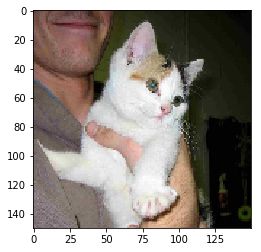

[[0.03629146]]


In [158]:
img_path2 = '/tmp/cats_and_dogs_filtered/validation/cats/cat.2008.jpg'
img2= image.load_img(img_path2,target_size = (150,150))
image_tensor = image.img_to_array(img2)
img_tensor = np.expand_dims(image_tensor, axis = 0)
img_tensor /=255.
print(img_tensor.shape)
plt.imshow(img_tensor[0])
plt.show()
print(model.predict(img_tensor))

#Heatmap of classifer

In [0]:
img_me = 'mypic.jpg'
last_conv_layer = model.get_layer('block5_conv4')

In [0]:
import cv2
from google.colab.patches import cv2_imshow
%matplotlib inline
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras import backend as K
from matplotlib import pyplot as plt
from keras.preprocessing import image
import numpy as np


In [0]:
def show_superimposed_image(img_path, heatmap):
  heatmap = cv2.resize(1-heatmap, (img_path.shape[1], img_path.shape[0]))
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_RAINBOW)

  superimposed_img = np.uint8(heatmap * 0.4 + np.uint8(255* img_path)*0.6)
  cv2_imshow(superimposed_img)

In [0]:
def class_activation_heatmap(img_path):
  x = np.expand_dims(img_path, axis=0)
  preds = model.predict(x)
  if preds > 0.5:
    print("Dog",(preds[0][0]*100),'%')
  else:
    print("Cat",(1-preds[0][0])*100,'%')
    
  
  grads = K.gradients(model.output[0], last_conv_layer.output)[0]

  pooled_grads = K.mean(grads, axis=(0, 1, 2))

  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0],model.output[0]])

  pooled_grads_value, conv_layer_output_value,pred_value = iterate([x])

  for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  arg1 = np.mean(conv_layer_output_value, axis=-1)
  arg1=np.maximum(arg1,0)
  heatmap = (arg1-arg1.min())/(arg1.max()-arg1.min())

  
  show_superimposed_image(img_path, heatmap)

In [0]:
images,labels = next(validation_generator)

Cat 86.6900086402893 %


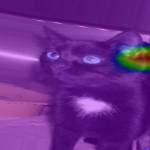

Cat 98.24543539434671 %


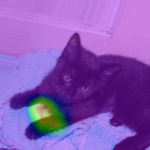

Cat 73.231041431427 %


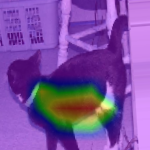

Dog 77.88743376731873 %


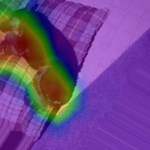

Cat 73.13113212585449 %


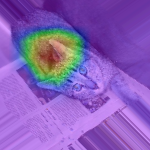

Cat 87.98626363277435 %


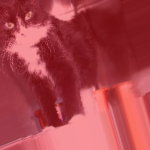

Dog 99.9668836593628 %


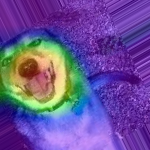

Dog 80.59467673301697 %


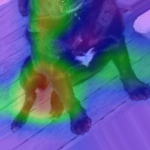

Cat 98.94116371870041 %


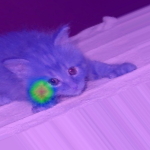

In [342]:
for arg2,image in enumerate(images[:9]):
  heatmapped = class_activation_heatmap(image)
  #plt.subplot(3, 5, arg2+1)
 # plt.imshow(heatmapped)
#plt.show()

#TSNE

In [0]:
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras import models, Model

In [350]:
activation_model = models.Model(inputs=[model.input], outputs=[model.get_layer('dense').output])
images, labels = next(validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),
    batch_size=1000,
    class_mode='binary'
))
activations = activation_model.predict(images)
from sklearn.manifold import TSNE
import time
time_start = time.time()

fashion_tsne = TSNE(random_state=42).fit_transform(activations)
class_names = ["Cat", "Dog"]


Found 1000 images belonging to 2 classes.


In [0]:
import matplotlib.patheffects as PathEffects
import seaborn as sns
def data_scatter(vecs, labels):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(labels))
    palette = np.array(sns.color_palette("husl", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(12, 12))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(vecs[:, 0], vecs[:, 1], c=palette[labels.astype(int)])
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')


    for idx in range(num_classes):

        # Place label at median position of vectors with corresponding label

        x_coord, y_coord = np.median(vecs[labels == idx, :], axis=0)
        txt = ax.text(x_coord, y_coord, class_names[idx], fontsize=16)
        # plot class index black with white contour
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=6, foreground="w"),
            PathEffects.Normal()])


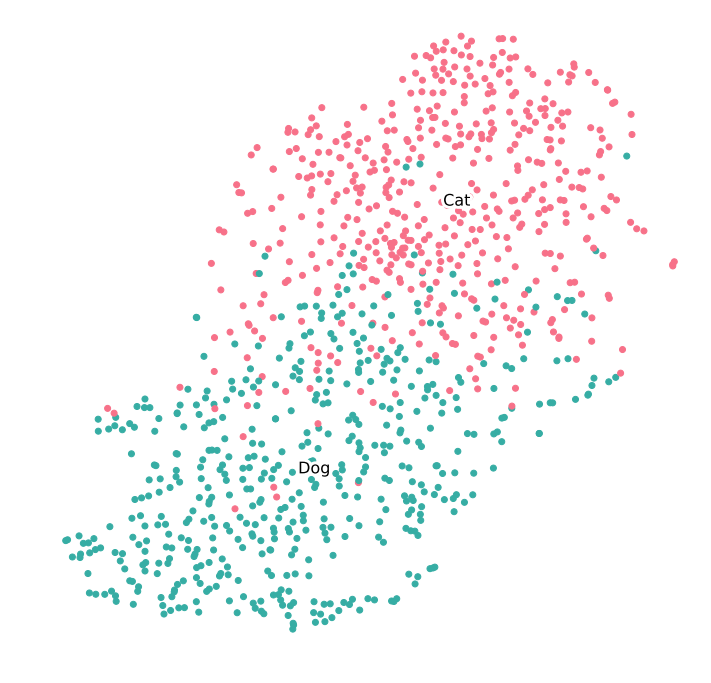

In [352]:
data_scatter(fashion_tsne, labels)


##Intermediate layers

In [39]:
from keras.layers import Flatten,Input
from keras import models
layer_outputs = [layer.output for layer in model.layers[1:22]]
activation_model = models.Model(input=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)
print(len(activations))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  """


21


(1, 75, 75, 128)


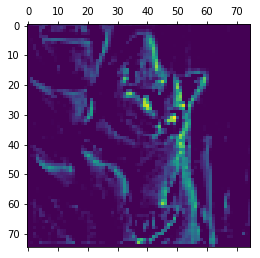

In [40]:
layer1 = activations[3]
print(layer1.shape)
plt.matshow(layer1[0,:,:,5], cmap='viridis')
plt.show()

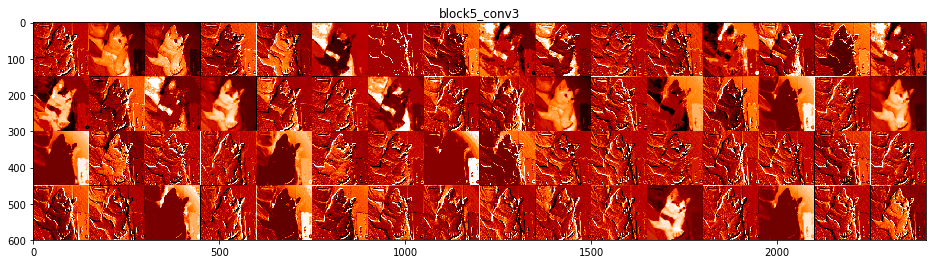

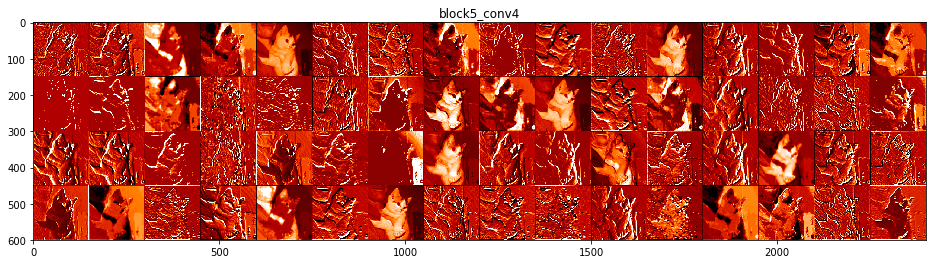

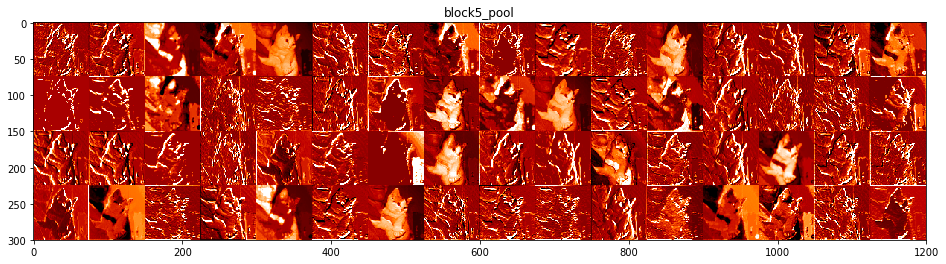

In [41]:
layer_names = []


#using only last 3 layers of final conv block of model
for layer in model.layers[19:22]:
  layer_names.append(layer.name)
  
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  # the feature map has shape (1, size, size, n_features)
  n_features = layer_activation.shape[-1] 
  
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image
      
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='gist_heat')


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


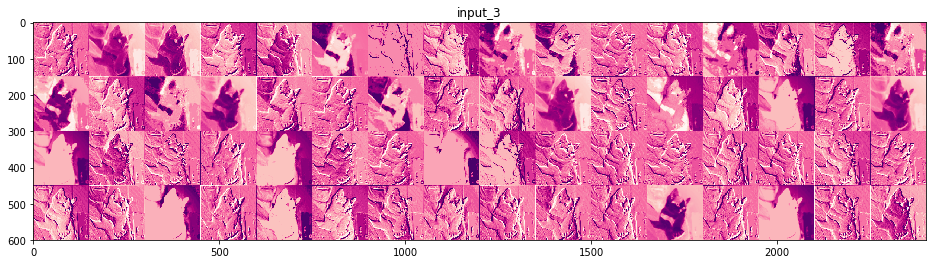

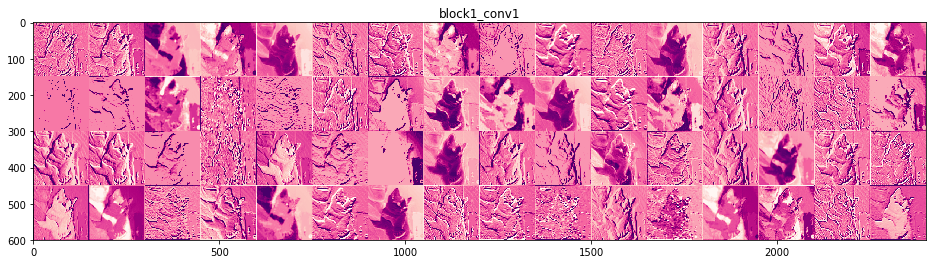

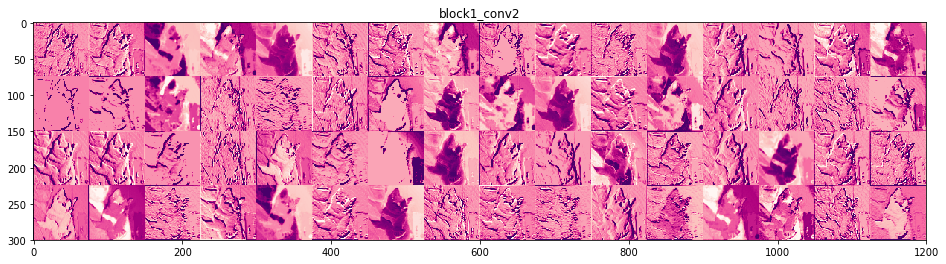

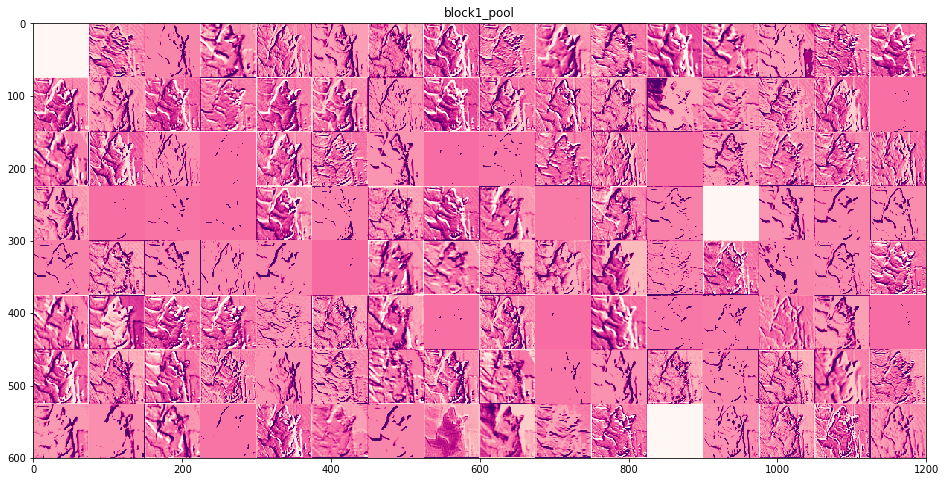

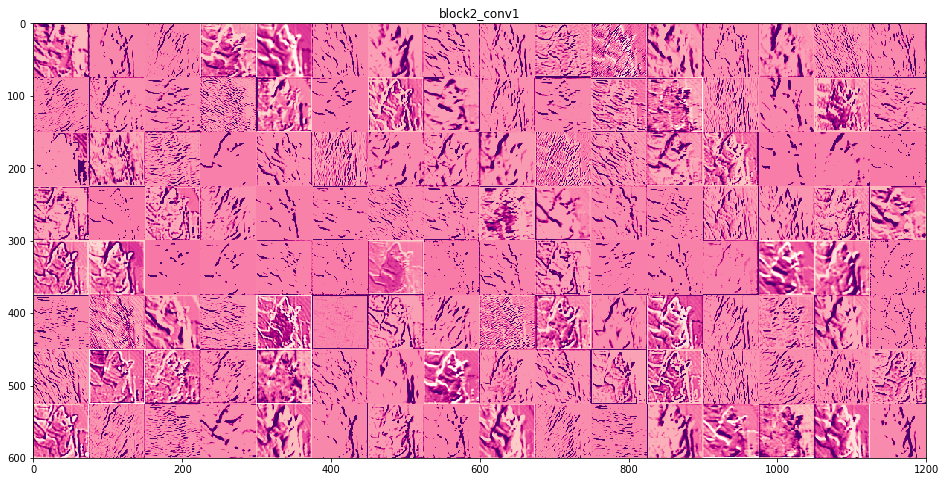

...

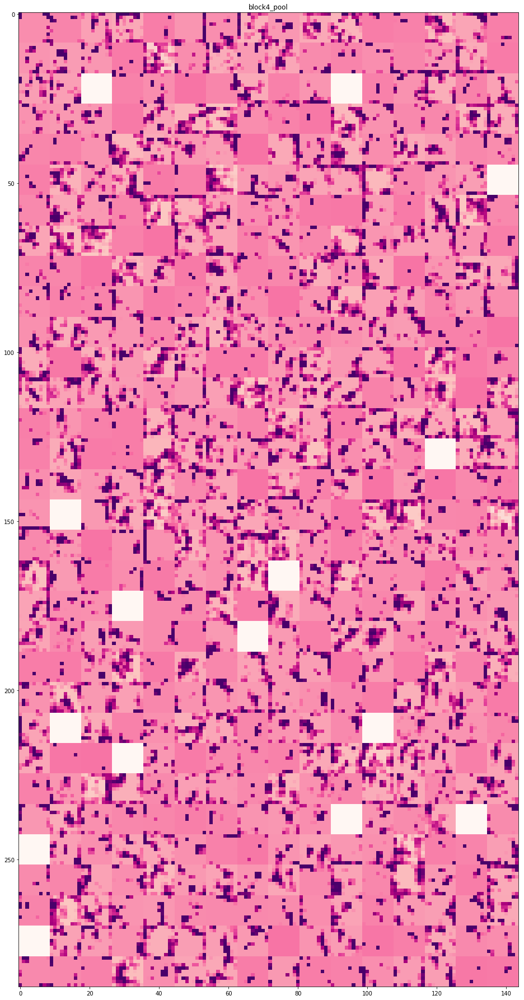

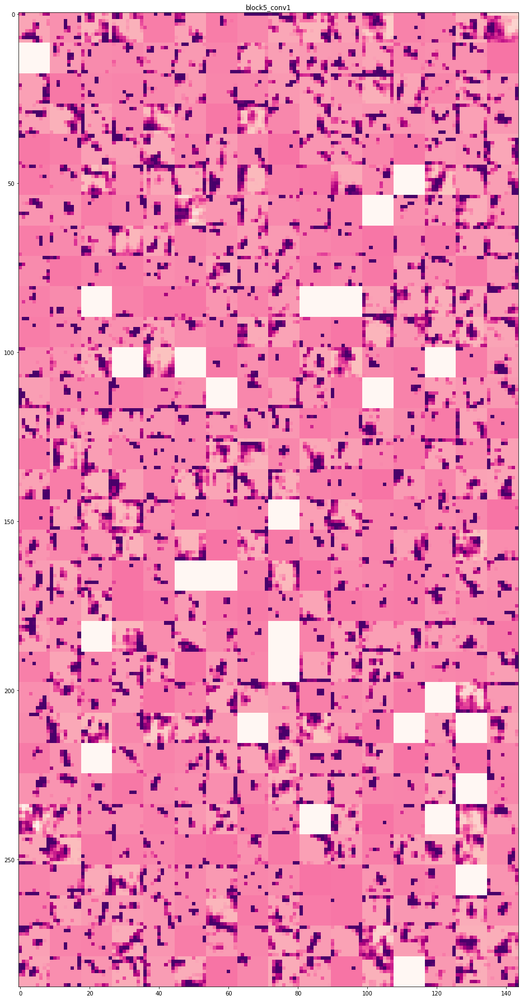

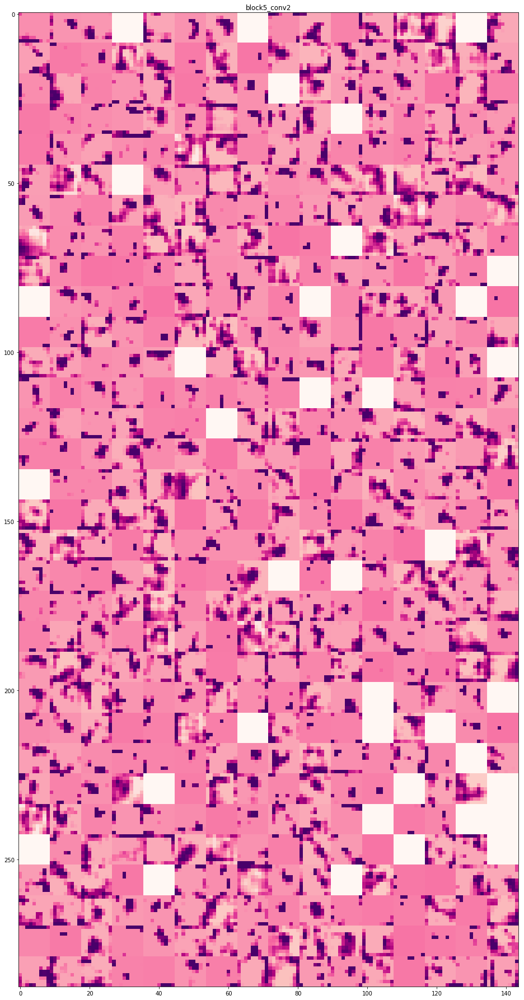

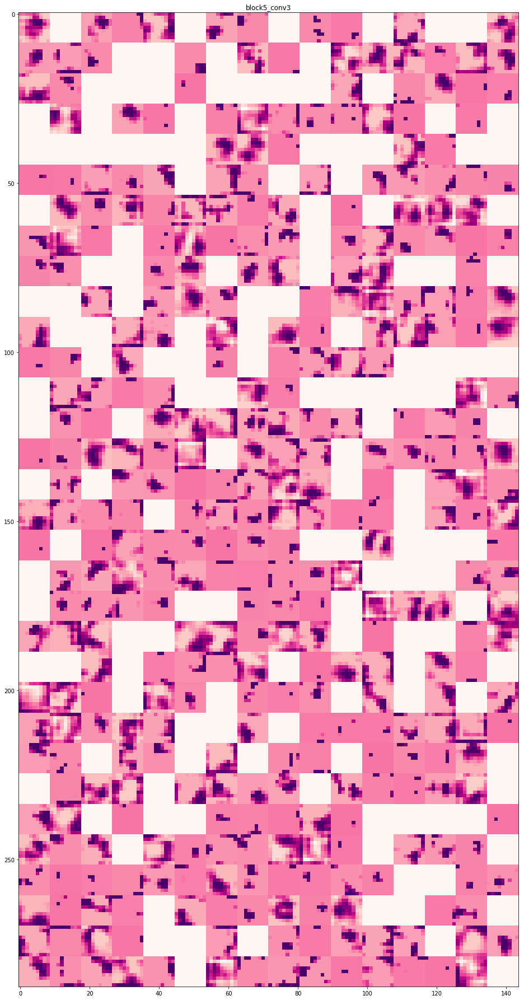

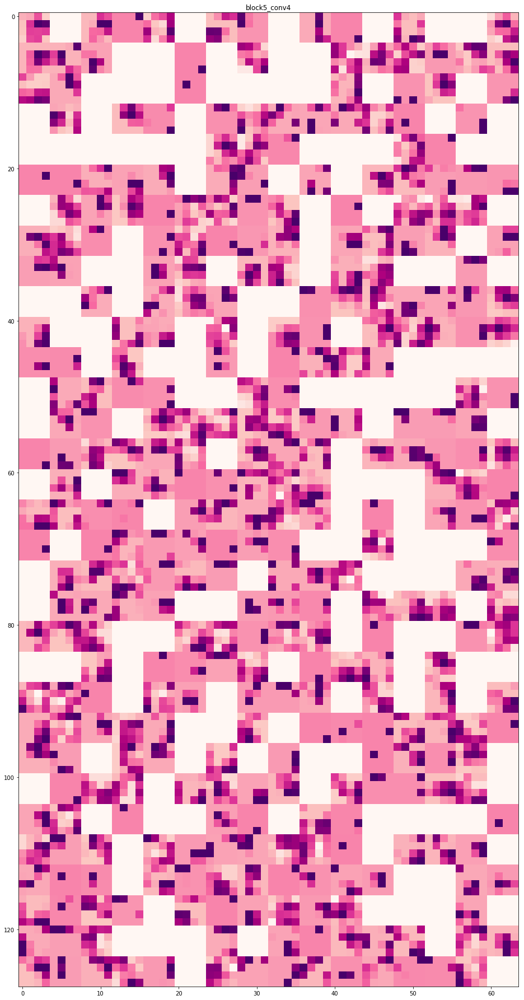

In [42]:
layer_names = []

for layer in model.layers[:22]:
  layer_names.append(layer.name)
  
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
  # the feature map has shape (1, size, size, n_features)
  n_features = layer_activation.shape[-1] 
  
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))
  
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]
      
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image
      
  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='RdPu')
